In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.mixture import GaussianMixture as GMM
import matplotlib.pyplot as plt
from rpy2.robjects import r
import rpy2.rinterface_lib.callbacks
import anndata2ri
import warnings
from sklearn.preprocessing import minmax_scale


warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', 500)
anndata2ri.activate()
%load_ext rpy2.ipython

In [2]:
adata_mistr = sc.read('mistr_all_integrated_leiden_annotated.h5ad')

In [3]:
adata_mistr = sc.read('mistr_all_integrated_leiden_annotated.h5ad')
adata_subset = adata_mistr[adata_mistr.obs.model != 'D/V forebrain']
adata_subset = adata_subset[adata_subset.obs.day.isin(['day 0', 'day 01', 'day 02', 'day 05', 'day 09'])]

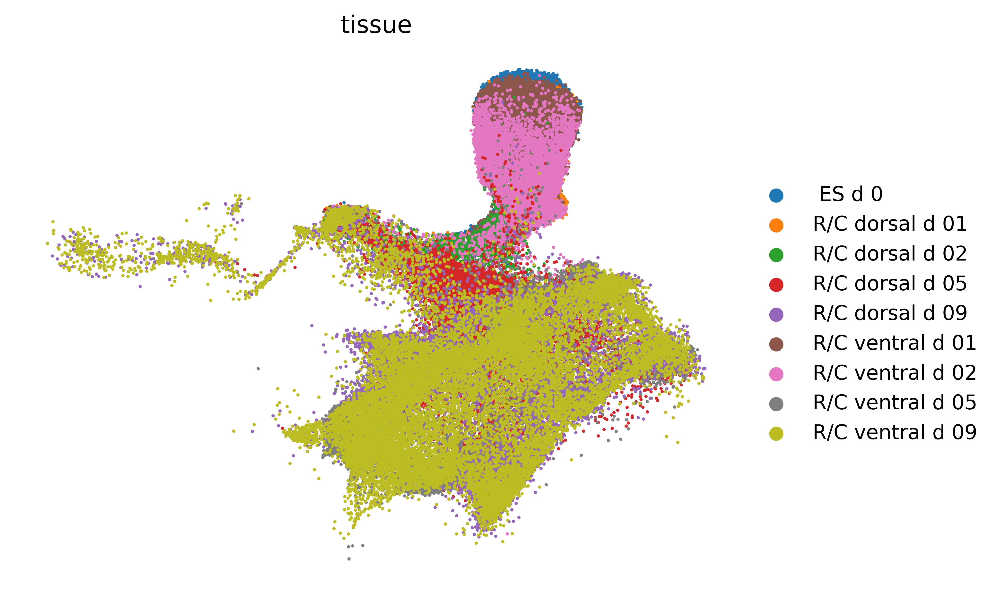

In [4]:
with plt.rc_context({ "figure.dpi": 600}):
    sc.pl.umap(adata_subset, color=['tissue'],ncols=2, vmin=0, cmap='jet', frameon=False, size=10)

OTX2 cutoff : 0.8585786444922177
GBX2 cutoff : 0.8575612860643007


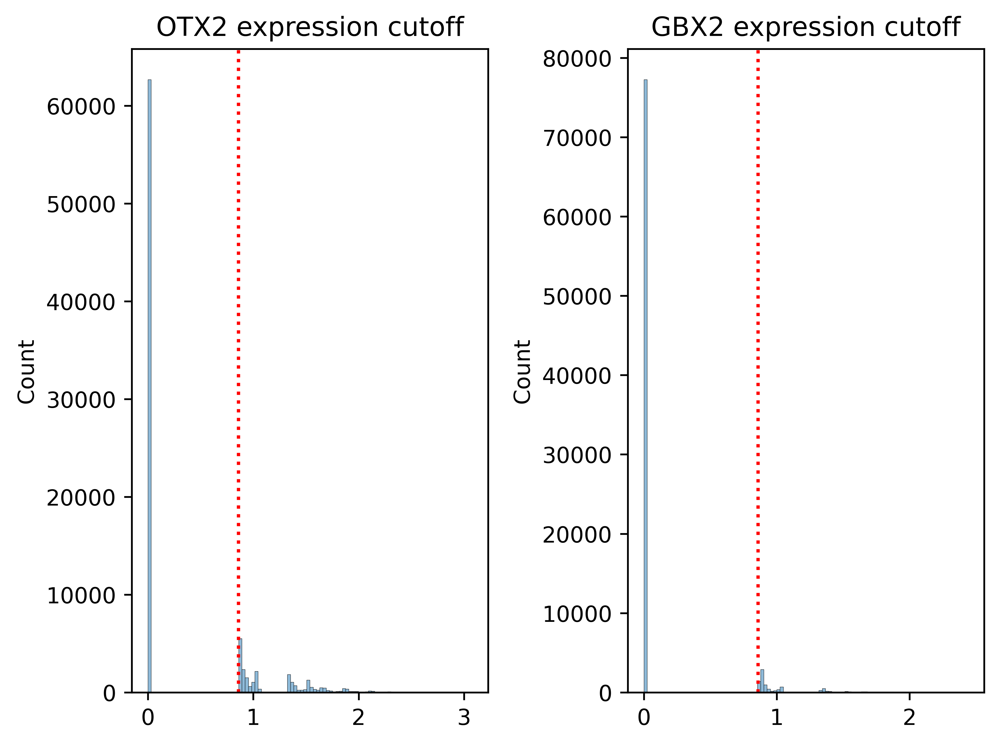

In [8]:
# Function determining cutoff for cell positive for marker
def expression_cutoff(gene, adata_temp):
    data = adata_temp[: , gene].layers['logcounts'].toarray()
    gmm = GMM(n_components=2, random_state=0).fit(data)
    labels = gmm.predict(data)
    df = pd.DataFrame({'expression': data.ravel(), 'label': labels})
    label0 = df[df['label'].isin([0])]['expression'].values
    label1 = df[df['label'].isin([1])]['expression'].values
    if label0.min() > label1.min():
        return label0.min()
    return label1.min()

cutoff_otx2 = expression_cutoff('OTX2',adata_subset)
cutoff_gbx2 = expression_cutoff('GBX2',adata_subset)
print('OTX2 cutoff :', cutoff_otx2)
print('GBX2 cutoff :', cutoff_gbx2)

with plt.rc_context({ "figure.dpi": 600}):
    fig, ax =plt.subplots(1,2)
    fig = sns.histplot(adata_subset[: , 'OTX2'].layers['logcounts'].toarray(), fill=True, legend=False, bins=100, ax=ax[0])
    fig.axvline(x=cutoff_otx2, ls=':', color='r')
    fig.set_title('OTX2 expression cutoff')
    
    fig = sns.histplot(adata_subset[: , 'GBX2'].layers['logcounts'].toarray(), fill=True, legend=False,bins=100, ax=ax[1])
    fig.axvline(x=cutoff_gbx2, ls=':', color='r')
    fig.set_title('GBX2 expression cutoff')
    plt.tight_layout()
    plt.show()

In [9]:
# Extract OTX+, GBX2+ and all day 0 cell id
otx2_cells = list(adata_subset[adata_subset[: , 'OTX2'].layers['logcounts'] >= cutoff_otx2, :].obs_names)
gbx2_cells = list(adata_subset[adata_subset[: , 'GBX2'].layers['logcounts'] >= cutoff_gbx2, :].obs_names)
d0_cells = list(adata_subset[adata_subset.obs.day.isin(['day 0'])].obs_names)

# Use the extracted cells to create OTX2+/d0 and GBX2+/d0 adata objexts
adata_otx2 = adata_subset[list(set(otx2_cells + d0_cells))]
adata_gbx2 = adata_subset[list(set(gbx2_cells + d0_cells))]

print(adata_otx2.shape)
print(adata_gbx2.shape)

(30517, 31522)
(16924, 31522)


In [14]:
# The day 0 was over-represented in gbx2 data, subsetting days to max 2500 cells 
target_cells = 2500

adatas = [adata_gbx2[adata_gbx2.obs['day'].isin([day])] for day in adata_gbx2.obs['day'].cat.categories]
for dat in adatas:
    if dat.n_obs > target_cells:
         sc.pp.subsample(dat, n_obs=target_cells)

adata_gbx2 = adatas[0].concatenate(*adatas[1:])

In [20]:
# Re-define variable genes
sc.pp.highly_variable_genes(adata_otx2, n_top_genes=2000, batch_key='tissue')
hvg_otx2 = adata_otx2.var[adata_otx2.var['highly_variable'] == True].index.to_list()

sc.pp.highly_variable_genes(adata_gbx2, n_top_genes=2000, batch_key='tissue')
hvg_gbx2 = adata_gbx2.var[adata_gbx2.var['highly_variable'] == True].index.to_list()

In [16]:
%%R -i adata_otx2 -i hvg_otx2 -i adata_gbx2 -i hvg_gbx2 -o otx2_fastmnn_embed -o gbx2_fastmnn_embed

# Fastmnn integration
Csparse_validate = "CsparseMatrix_validate"
library(Seurat)
library(batchelor)

run_fastmnn = function(adata, hvg){
    sobj <- as.Seurat(adata, counts = "counts", data = "logcounts")
    sobj <- subset(sobj, features=hvg)
    expr <- GetAssayData(sobj, slot = "data")
    sce <- fastMNN(expr, batch = sobj@meta.data[['tissue']])
    sobj@reductions['fastmnn'] <- CreateDimReducObject(reducedDim(sce, "corrected"), key = 'fastmnn_')
    fastmnn_embed = Embeddings(object = sobj, reduction = "fastmnn")
    return(fastmnn_embed)
}

otx2_fastmnn_embed = run_fastmnn(adata_otx2, hvg_otx2)
gbx2_fastmnn_embed = run_fastmnn(adata_gbx2, hvg_gbx2)

R[write to console]: Loading required package: SeuratObject

R[write to console]: Loading required package: sp

R[write to console]: The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, were retired in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.

R[write to console]: 
Attaching package: ‘sp’


R[write to console]: The following object is masked from ‘package:IRanges’:

    %over%


R[write to console]: 
Attaching package: ‘SeuratObject’


R[write to console]: The following object is masked from ‘package:SummarizedExperiment’:

    Assays


R[write to console]: The following object is masked from ‘package:GenomicRanges’:

    intersect


R[write to console]: The following object is masked from ‘package:GenomeInfoDb’:

    intersect


R[writ


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

R[write to console]: 
Attaching package: ‘Seurat’


R[write to console]: The following object is masked from ‘package:SummarizedExperiment’:

    Assays




In [17]:
# Compute umap with the integrated embedding
adata_otx2.obsm['fastmnn'] = otx2_fastmnn_embed
sc.pp.neighbors(adata_otx2, use_rep="fastmnn")
sc.tl.umap(adata_otx2)

adata_gbx2.obsm['fastmnn'] = gbx2_fastmnn_embed
sc.pp.neighbors(adata_gbx2, use_rep="fastmnn")
sc.tl.umap(adata_gbx2)

2024-03-18 23:17:52.541489: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-03-18 23:17:52.587050: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-18 23:17:52.587085: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-18 23:17:52.588552: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-18 23:17:52.596200: I tensorflow/core/platform/cpu_feature_guar

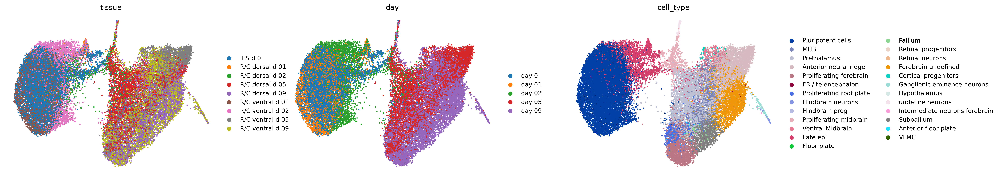

In [31]:
with plt.rc_context({ "figure.dpi": 300}):
    sc.pl.umap(adata_otx2, color=['tissue','day','cell_type'],ncols=3, vmin=0, cmap='jet', frameon=False, size=20,wspace=0.2,save='_OTX2_integration.png')

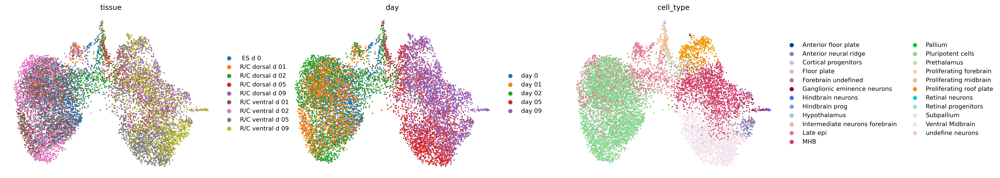

In [32]:
with plt.rc_context({ "figure.dpi": 300}):
    sc.pl.umap(adata_gbx2, color=['tissue','day','cell_type'],ncols=3, vmin=0, cmap='jet', frameon=False, size=20,wspace=0.2,save='_GBX2_integration.png')

In [ ]:
adata_otx2.write('adata_otx2.h5ad')
adata_gbx2.write('gbx2_adata.h5ad')

# Prepare data for monocle3

In [2]:
adata_otx2 = sc.read('adata_otx2.h5ad')
adata_gbx2 = sc.read('gbx2_adata.h5ad')

hvg_otx2 = adata_otx2.var[adata_otx2.var['highly_variable'] == True].index.to_list()
hvg_gbx2 = adata_gbx2.var[adata_gbx2.var['highly_variable'] == True].index.to_list()

In [6]:
%%R -i adata_otx2 -i hvg_otx2 -i adata_gbx2 -i hvg_gbx2

library(Seurat)
library(monocle3)
library(ggplot2)

sobj_otx2 <- as.Seurat(adata_otx2, counts = "counts", data = "logcounts")
sobj_otx2 = subset(sobj_otx2, features = hvg_otx2)

sobj_gbx2 <- as.Seurat(adata_gbx2, counts = "counts", data = "logcounts")
sobj_gbx2 = subset(sobj_gbx2, features = hvg_gbx2)

R[write to console]: Loading required package: SeuratObject

R[write to console]: Loading required package: sp

R[write to console]: The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, were retired in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.

R[write to console]: 
Attaching package: ‘sp’


R[write to console]: The following object is masked from ‘package:IRanges’:

    %over%


R[write to console]: 
Attaching package: ‘SeuratObject’


R[write to console]: The following object is masked from ‘package:SummarizedExperiment’:

    Assays


R[write to console]: The following object is masked from ‘package:GenomicRanges’:

    intersect


R[write to console]: The following object is masked from ‘package:GenomeInfoDb’:

    intersect


R[writ


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

R[write to console]: 
Attaching package: ‘Seurat’


R[write to console]: The following object is masked from ‘package:SummarizedExperiment’:

    Assays


R[write to console]: 
Attaching package: ‘monocle3’


R[write to console]: The following objects are masked from ‘package:Biobase’:

    exprs, fData, fData<-, pData, pData<-




In [7]:
%%R
# This is a helper function from SeuratWrappers package, which converst seurat object to cds
AssociatedDimReducs <- function(
  object,
  assay = DefaultAssay(object = object),
  global = TRUE
) {
  return(Filter(
    f = function(x) {
      check <- DefaultAssay(object = object[[x]]) == assay
      if (global) {
        check <- c(check, IsGlobal(object = object[[x]]))
      }
      return(any(check))
    },
    x = Reductions(object = object)
  ))
}


convert_to_cds <- function(
  x,
  assay = DefaultAssay(object = x),
  reductions = AssociatedDimReducs(object = x, assay = assay),
  default.reduction = DefaultDimReduc(object = x, assay = assay),
  graph = paste0(assay, '_snn'),
  group.by = NULL,
  ...
) {
  clusters.key <- 'monocle3_clusters' 
  partitions.key <- 'monocle3_partitions'
  # Add assay data
  # Cheat and use as.SingleCellExperiment
  cds <- as(
    object = as.SingleCellExperiment(x = x, assay = assay),
    Class = 'cell_data_set'
  )
  # Ensure we have a counts assay
  if (is.null(x = SummarizedExperiment::assays(x = cds)$counts)) {
    SummarizedExperiment::assays(x = cds)$counts <- SummarizedExperiment::assays(x = cds)[[1]]
  }
  # Add Size_factor
  if (!"Size_Factor" %in% colnames(x = SummarizedExperiment::colData(x = cds))) {
    size.factor <- paste0('nCount_', assay)
    if (size.factor %in% colnames(x = x[[]])) {
      SummarizedExperiment::colData(x = cds)$Size_Factor <- x[[size.factor, drop = TRUE]]
    }
  }
  # Add DimReducs: Embeddings become a reduced dim, Loadings go to
  # reduce_dim_aux$gene_loadings, Stdev goes go reduce_dim_aux$prop_var_expl
  # First, reset the ones from as.SingleCellExperiment
  SingleCellExperiment::reducedDims(x = cds)[SingleCellExperiment::reducedDimNames(x = cds)] <- NULL
  reductions <- intersect(
    x = reductions,
    y = AssociatedDimReducs(object = x, assay = assay)
  )
  for (reduc in reductions) {
    SingleCellExperiment::reducedDims(x = cds)[[toupper(x = reduc)]] <- Embeddings(object = x[[reduc]])
    loadings <- Loadings(object = x[[reduc]])
    if (!IsMatrixEmpty(x = loadings)) {
      slot(object = cds, name = 'reduce_dim_aux')[['gene_loadings']] <- loadings
    }
    stdev <- Stdev(object = x[[reduc]])
    if (length(x = stdev)) {
      slot(object = cds, name = 'reduce_dim_aux')[['prop_var_expl']] <- stdev
    }
  }
  # Add clustering information
  # TODO: Figure out if I need to add relations, distMatrix, or clusters/partitions
  if (!is.null(x = group.by)) {
    Idents(object = x) <- group.by
  }
  # if (clusters.key %in% colnames(x = x[[]])) {
  clusters.list <- if (is.null(x = group.by) && all(c(clusters.key, partitions.key) %in% colnames(x = x[[]]))) {
    message("Using existing Monocle 3 cluster membership and partitions")
    list(
      partitions = factor(x = x[[partitions.key, drop = TRUE]]),
      clusters = factor(x = x[[clusters.key, drop = TRUE]])
    )
  } else if (graph %in% names(x = x)) {
    g <- igraph::graph_from_adjacency_matrix(
      adjmatrix = x[[graph]],
      weighted = TRUE
    )
    # TODO: figure out proper partitioning scheme
    # partitions <- igraph::components(graph = g)$membership[colnames(x = x)]
    warning(
      "Monocle 3 trajectories require cluster partitions, which Seurat does not calculate. Please run 'cluster_cells' on your cell_data_set object",
      call. = FALSE,
      immediate. = TRUE
    )
    partitions <- rep_len(x = 1, length.out = ncol(x = x))
    list(
      cluster_result = list(
        g = g,
        relations = NULL,
        distMatrix = 'matrix',
        coord = NULL,
        edge_links = NULL,
        optim_res = list(
          membership = as.integer(x = Idents(object = x)),
          modularity = NA_real_
        )
      ),
      partitions = factor(x = partitions),
      clusters = Idents(object = x)
    )
  } else {
    list()
  }
  if (length(x = clusters.list)) {
    slot(object = cds, name = 'clusters')[[toupper(x = default.reduction)]] <- clusters.list
  }
  # TODO: Add translated results from learn_graph
  return(cds)
}

cds_otx2 = convert_to_cds(sobj_otx2)
cds_gbx2 = convert_to_cds(sobj_gbx2)

# Compute pseudotime with Monocle3

#### OTX2

In [9]:
%%R
cds_otx2 <- cluster_cells(cds_otx2, resolution=0.000035)
cds_otx2 <- learn_graph(cds_otx2, use_partition = FALSE) #graph learned across all partitions
umap = plot_cells(cds_otx2, show_trajectory_graph = TRUE,
           label_principal_points = TRUE)
ggsave('monocle3_plots_final/otx2_monocle_umap.pdf', dpi=400)

  |======================================================================| 100%
Saving 6.67 x 6.67 in image


In [16]:
%%R -o otx2_pseudotime_values
cds_otx2 <- order_cells(cds_otx2,root_pr_nodes='Y_35')
otx2_pseudotime_values = pseudotime(cds_otx2, reduction_method = "UMAP")
umap = plot_cells(cds_otx2, color_cells_by = "pseudotime", label_branch_points=FALSE, label_leaves=FALSE,cell_size=0.7)
ggsave('monocle3_plots_final/otx2_monocle_pseudotime_and_graph.pdf', dpi=350)
ggsave('monocle3_plots_final/otx2_monocle_pseudotime_and_graph.png', dpi=350)

R[write to console]: Cells aren't colored in a way that allows them to be grouped.



Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


#### GBX2

In [11]:
%%R
# 0.0002
cds_gbx2 <- cluster_cells(cds_gbx2, resolution=0.0007)
cds_gbx2 <- learn_graph(cds_gbx2, use_partition = FALSE) #graph learned across all partitions
umap = plot_cells(cds_gbx2, show_trajectory_graph = TRUE,
           label_principal_points = TRUE)
ggsave('monocle3_plots_final/gbx2_monocle_umap.pdf', dpi=400)

  |======================================================================| 100%
Saving 6.67 x 6.67 in image


In [18]:
%%R -o gbx2_pseudotime_values
cds_gbx2 <- order_cells(cds_gbx2,root_pr_nodes='Y_109')
gbx2_pseudotime_values = pseudotime(cds_gbx2, reduction_method = "UMAP")
umap = plot_cells(cds_gbx2, color_cells_by = "pseudotime", label_branch_points=FALSE, label_leaves=FALSE,cell_size=0.7)
ggsave('monocle3_plots_final/gbx2_monocle_pseudotime_and_graph.pdf', dpi=350)
ggsave('monocle3_plots_final/gbx2_monocle_pseudotime_and_graph.png', dpi=350)



R[write to console]: Cells aren't colored in a way that allows them to be grouped.



Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


In [13]:
%%R
# write cds to file
saveRDS(cds_otx2, 'otx2_cds.RDS')
saveRDS(cds_gbx2, 'gbx2_cds.RDS')


In [3]:
%%R -o otx2_pseudotime_values -o gbx2_pseudotime_values
library(monocle3)
cds_otx2 = readRDS('otx2_cds.RDS')
cds_gbx2 = readRDS('gbx2_cds.RDS')

otx2_pseudotime_values = pseudotime(cds_otx2, reduction_method = "UMAP")
gbx2_pseudotime_values = pseudotime(cds_gbx2, reduction_method = "UMAP")

Loading required package: Biobase
Loading required package: BiocGenerics

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min

Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()'. To cite Bioconductor, see
    'citation("Biobase")', and for packages 'citation("pkgname")'.

Loading required package: SingleCellExperiment
Loading required package: SummarizedExperiment
Loading required package: MatrixGenerics
Loading required

# Plot temporal gene expression along pseudotime

## Fit gene expression against pseudotime

In [10]:
adata_otx2.obs['monocle3_pseudotime'] = otx2_pseudotime_values
adata_gbx2.obs['monocle3_pseudotime'] = gbx2_pseudotime_values

gene_list = ['POU5F1','OTX2','HESX1','CYP26A1','LRRC75A','DLK1','SHISA2','FZD5','SIX3','FEZF1',
'CDH2','HES4','HES5','GPC3','SFRP2','LHX5','ZFHX4','PAX6','FST','SP5','ZIC3','GBX2','CRABP2',
'SOX1','FGFBP3','NKX6-2','NKD1','IGFBP5','PTCH1','VCAN','NRXN3']

# Function that fits gene expression with pseudotime
def assign_polyfit(adata):
    df=pd.DataFrame(adata[:,gene_list].copy().X.toarray(),columns=gene_list)
    df['pseudotime']=adata.obs['monocle3_pseudotime'].values
    df['cell_type']=adata.obs['cell_type'].values
    df['day']=adata.obs['day'].values
    
    df=df.sort_values(by='pseudotime',ascending=True)
    df_fit=df
    for i,gene in enumerate(gene_list):

        fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=7)
        f = np.poly1d(fit)
        df_fit[gene]=f(df['pseudotime'])
    
    return df_fit
    
    
# Call polynomial fit function
df_fit_otx2 = assign_polyfit(adata_otx2)
df_fit_gbx2 = assign_polyfit(adata_gbx2)  
    
# Concat gene X cell dataframes
df_fit_otx2['source'] = 'OTX2'
df_fit_gbx2['source'] = 'GBX2'
df_concat = pd.concat([df_fit_otx2,df_fit_gbx2 ])

# Scale merged dataframe
df_concat.iloc[:,:-4] = minmax_scale(df_concat.iloc[:,:-4], axis=0)

# Split gene X cell dataframe 
df_fit_otx2=df_concat[df_concat.source.isin(['OTX2'])]
df_fit_gbx2=df_concat[df_concat.source.isin(['GBX2'])]


# OTX2

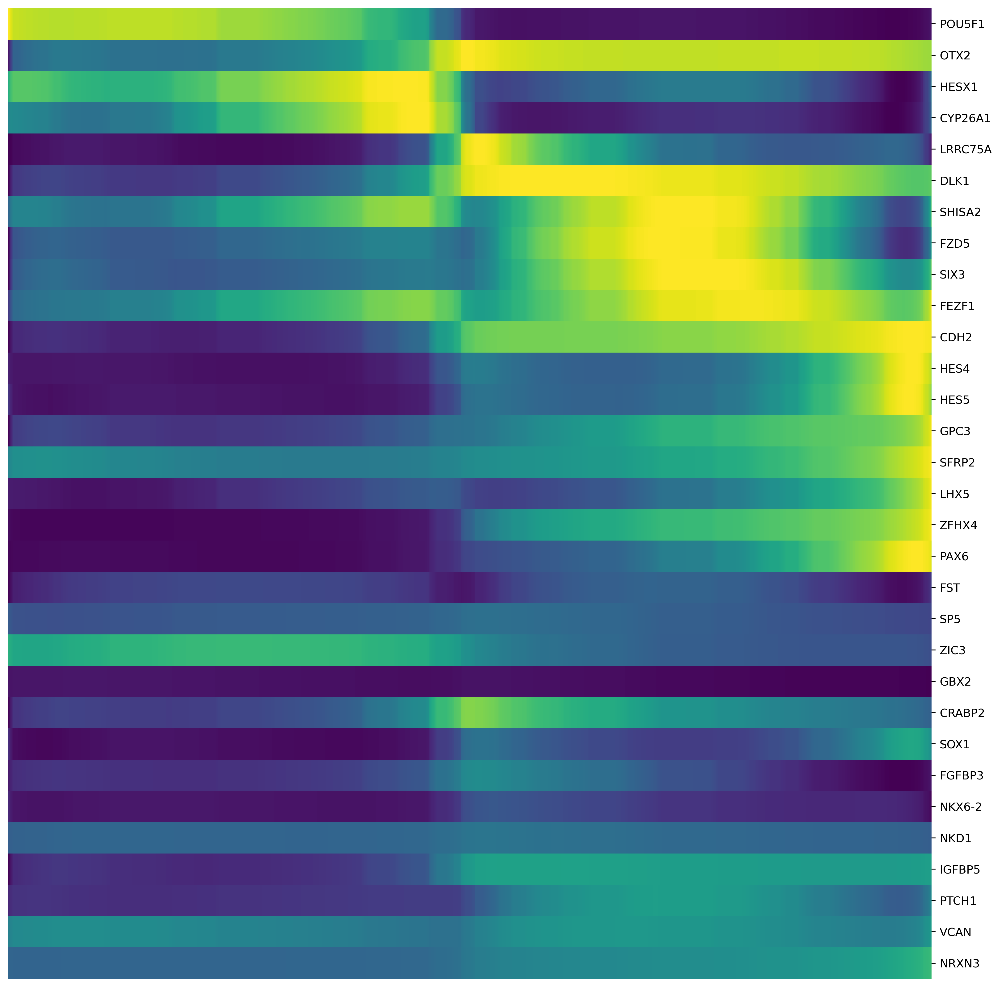

In [11]:
with plt.rc_context({ "figure.dpi": 350}):
    cm = sns.clustermap(df_fit_otx2.iloc[:,:-4].T,col_cluster=False,row_cluster=False,cmap='viridis',standard_scale=None, 
                        figsize=(15,15),xticklabels=False)
    cm.cax.set_visible(False)
    cm.ax_row_dendrogram.set_visible(False)
    cm.ax_col_dendrogram.set_visible(False)
    
    cm.savefig('monocle3_plots_final/otx2_temporal_gene_expression.pdf')
    cm.savefig('monocle3_plots_final/otx2_temporal_gene_expression.png')

# GBX2

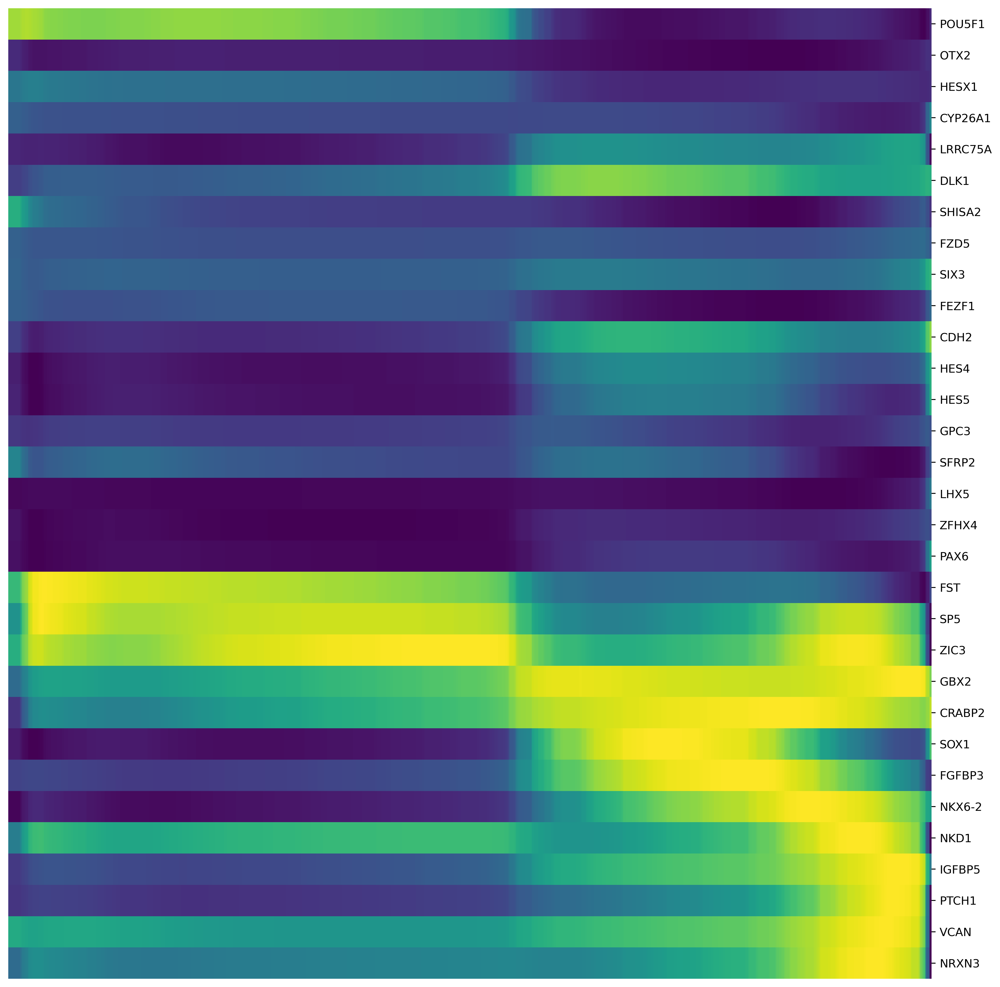

In [12]:
with plt.rc_context({ "figure.dpi": 350}):
    cm = sns.clustermap(df_fit_gbx2.iloc[:,:-4].T,col_cluster=False,row_cluster=False,cmap='viridis',standard_scale=None, 
                        figsize=(15,15),xticklabels=False)
    cm.cax.set_visible(False)
    cm.ax_row_dendrogram.set_visible(False)
    cm.ax_col_dendrogram.set_visible(False)
    
    cm.savefig('monocle3_plots_final/gbx2_temporal_gene_expression.pdf')
    cm.savefig('monocle3_plots_final/gbx2_temporal_gene_expression.png')    